In [9]:
#importing library 
import numpy as np
import pandas as pd

# for visualization purpose
import matplotlib.pyplot as plt
from plotnine import ggplot, aes, geom_point,  theme_minimal # 별도 설치 필요 (pip install --user plotnine)

# for preprocessing purpose
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# for doing PCA
from sklearn.decomposition import PCA

# for t-SNE implemention 
from sklearn.manifold import TSNE

# for data load
from sklearn.datasets import fetch_openml

import time

In [10]:
pd.set_option('display.max_columns', 800)

In [11]:
mnist = fetch_openml('mnist_784')

In [12]:
df = mnist.data
columns_list = df.columns.to_list()

In [13]:
df.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pix

### 데이터 확인 및 정규화

In [14]:
df.describe()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pix

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Columns: 784 entries, pixel1 to pixel784
dtypes: float64(784)
memory usage: 418.7 MB


- 70000 * 784크기 데이터 (데이터 개수 : 70000개, 각 행은 28 * 28 크기의 matrix 값을 나타냄, 각 행의 정보가 숫자 하나를 나타냄)
- 결측치 없음
- 각 픽셀의 값이 0~255 사이의 값을 가짐
- 따라서 mnist data의 경우 보통 정규화하는 방식인 열별로 정규화를 하는 것이 아니라, 셀 별로 255를 나누는 방식으로 정규화하는 것 같음(아마도...)  

In [16]:
#정규화(각 픽셀 값이 0~1값을 가지도록)
df = df / 255.0

#라벨 추가(실제 값)
df['label'] = mnist.target

C:\Users\lshdl\AppData\Local\Temp\ipykernel_9832\1901962779.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


In [17]:
df

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pix

In [18]:
np.random.seed(42)
index = np.random.permutation(df.shape[0]) # 랜덤 순서 추출

<Figure size 640x480 with 0 Axes>

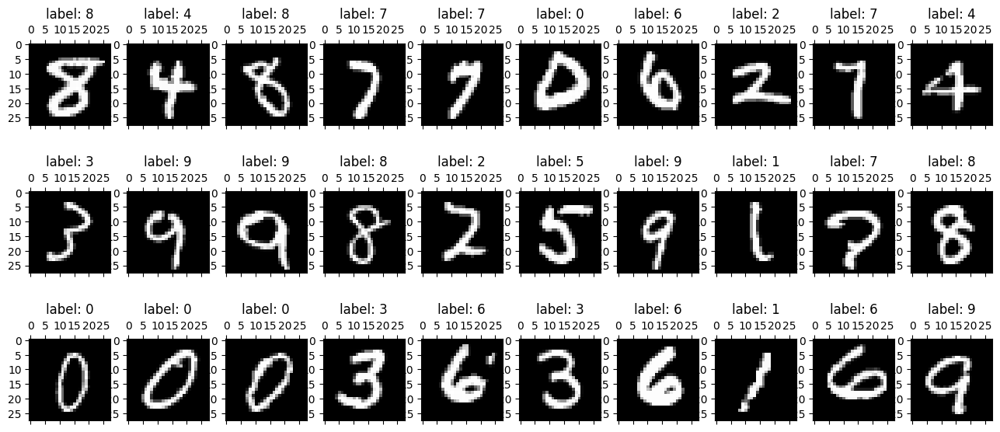

In [19]:
plt.gray()
fig = plt.figure(figsize = (16,7))
for i in range(0, 30):
    ax = fig.add_subplot(3, 10, i+1, title = 'label: ' + str(df.loc[index[i], 'label']))
    ax.matshow(df.loc[index[i], columns_list].values.reshape((28,28)).astype(float))


### 구현

#### PCA

In [20]:
pca = PCA(n_components = 2)
pca_result1 = pca.fit_transform(df[columns_list].values)

In [21]:
pca_result1.shape

(70000, 2)

In [22]:
pca_result1

array([[ 0.47941631, -1.24058026],
       [ 3.96269951, -1.13740945],
       [-0.23135228,  1.54399009],
       ...,
       [-1.06471578,  2.3143854 ],
       [-1.2165255 , -0.45698673],
       [ 4.15238254, -0.32737566]])

#### t-sne

In [23]:
# t-sne는 계산비용이 커서 7000개만 사용
n_sne = 7000 

# 계산 비용과 노이즈를 억제하기 위해 일차적으로 PCA를 통해 30차원으로 축소
pca = PCA(n_components=30)
pca_result = pca.fit_transform(df.loc[index[:n_sne], columns_list].values)

In [24]:
y = mnist.target[index[:n_sne]]
label = y.astype(int).astype(int).values

C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.


########################################


C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.


########################################


C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.


########################################


C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.


########################################


C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.


########################################


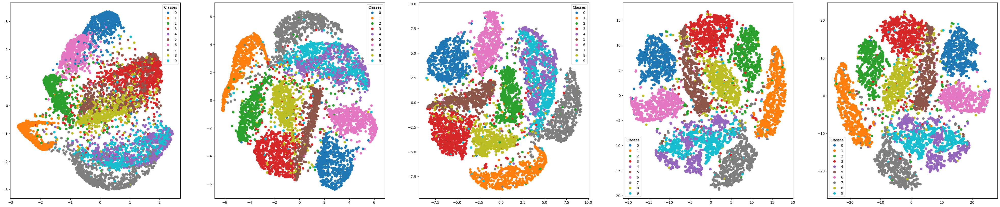

In [25]:
# 첫번째 그림부터 10, 50, 100,...
learning_rate = [10, 50, 100, 500, 1000]
    
nrow, ncol = 1, len(learning_rate)
width = 10
fig, axes = plt.subplots(
nrow, ncol, figsize=(width * ncol, width * nrow))
for j, learn in enumerate(learning_rate):
    ax = axes[j]
    pos = TSNE(n_components=2, learning_rate = learn, n_iter=300).fit_transform(pca_result)
    scatter = ax.scatter(pos[:, 0], pos[:, 1],c=label, cmap='tab10')
    
    legend = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend)
    print("##"*20)

결과를 보면 learning rate가 너무 낮을 때, cluster가 제대로 형성되지 않은 것을 확인할 수 있다.

In [26]:
tsne_start_time = time.time()
tsne1 = TSNE(n_components = 2, perplexity = 2, n_iter = 300)
tsne_result1 = tsne1.fit_transform(pca_result)
tsne_elapsed_time = time.time() - tsne_start_time

C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.


In [27]:

tsne2 = TSNE(n_components = 2, perplexity = 10, n_iter = 300)
tsne_result2 = tsne2.fit_transform(pca_result)

tsne3 = TSNE(n_components = 2, perplexity = 30, n_iter = 300)
tsne_result3 = tsne3.fit_transform(pca_result)

tsne4 = TSNE(n_components = 2, perplexity = 50, n_iter = 300)
tsne_result4 = tsne4.fit_transform(pca_result)

tsne5 = TSNE(n_components = 2, perplexity = 100, n_iter = 300)
tsne_result5 = tsne5.fit_transform(pca_result)

tsne6 = TSNE(n_components = 2, perplexity = 300, n_iter = 300)
tsne_result6 = tsne6.fit_transform(pca_result)

C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
C:\Users\lshdl\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
C

- perplexity가 커질수록, sigma 값도 커짐

### 시각화

패키지 설치 후 커널 끄고 다시 시작
pip install --user plotnine

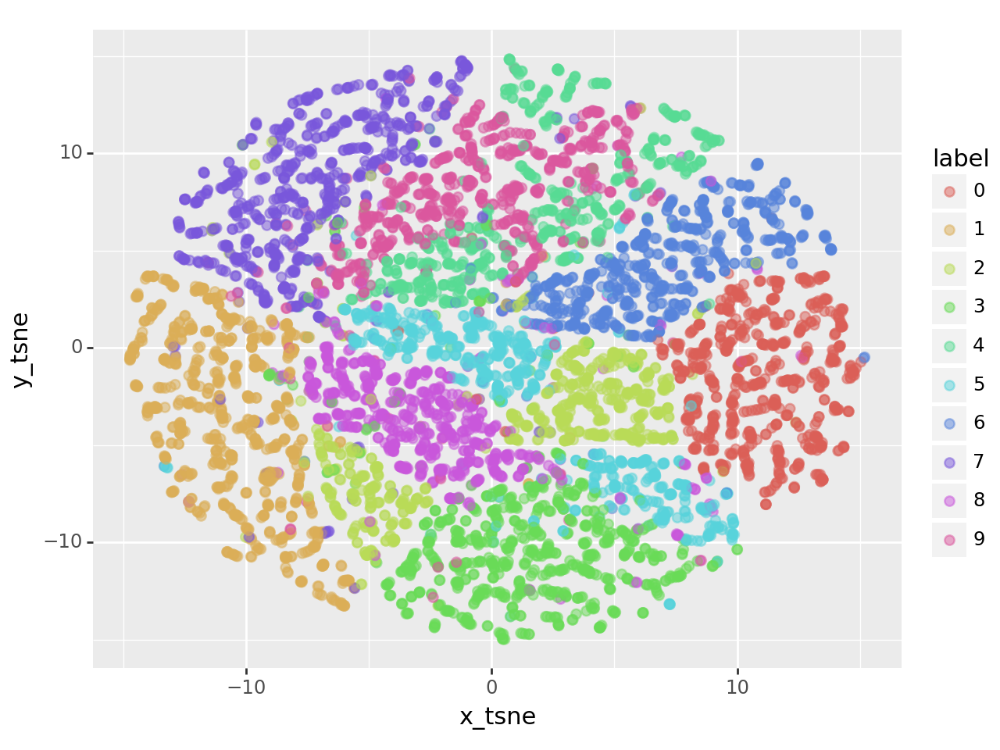

<Figure Size: (640 x 480)>

In [23]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result1[:, 0]
df_tsne['y_tsne'] = tsne_result1[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5)
chart

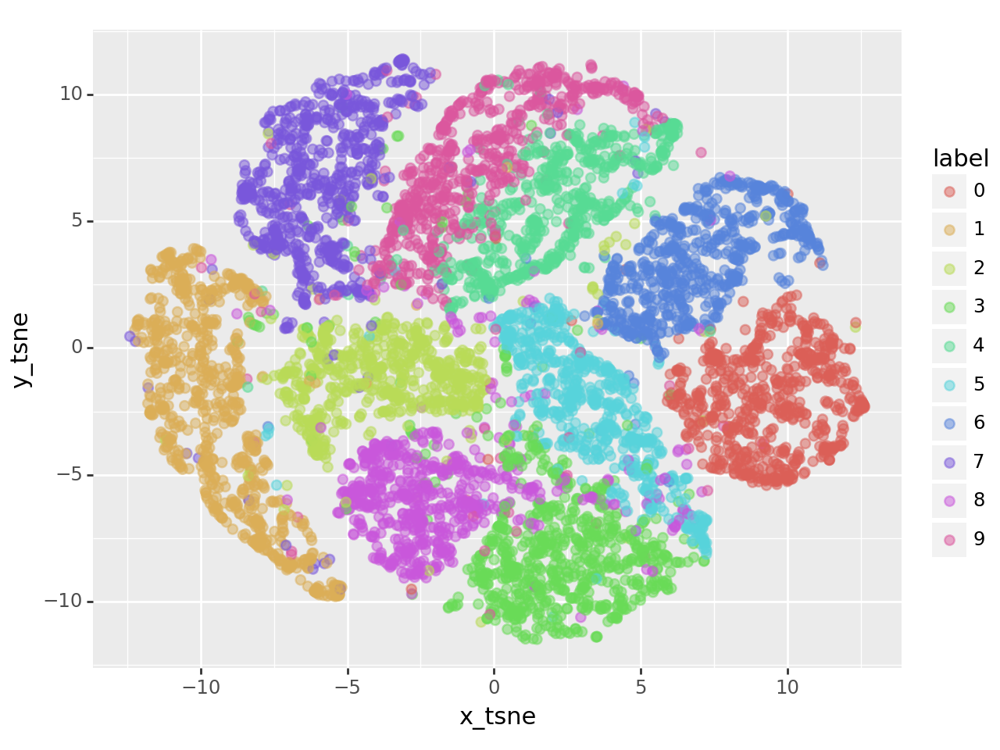

<Figure Size: (640 x 480)>

In [24]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result2[:, 0]
df_tsne['y_tsne'] = tsne_result2[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5)
chart

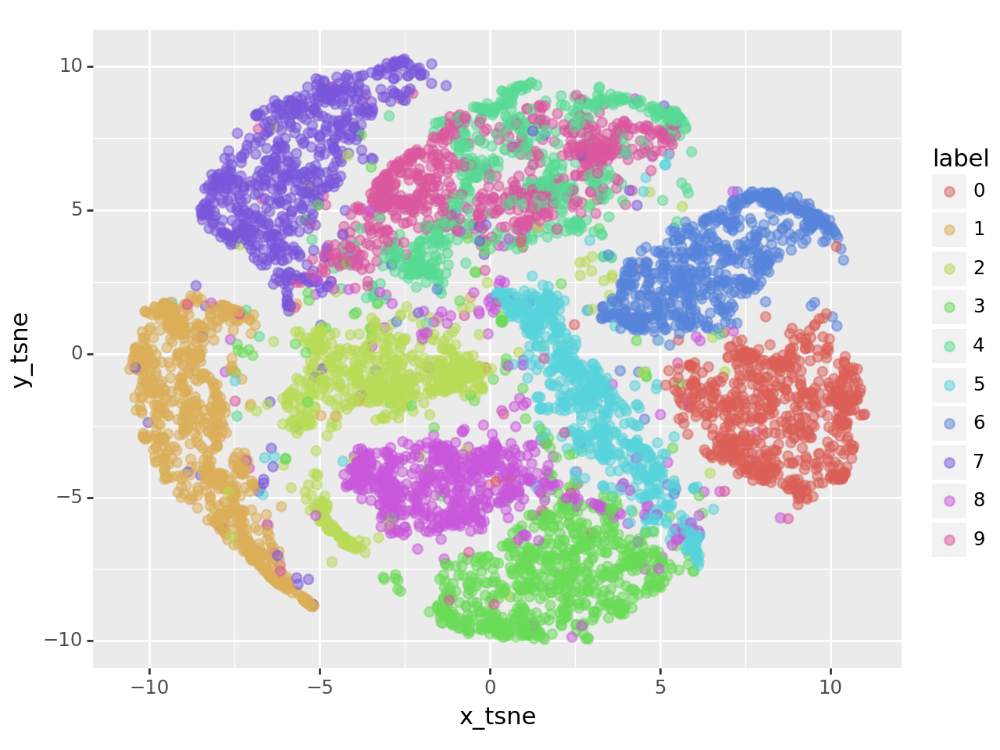

<Figure Size: (640 x 480)>

In [25]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result3[:, 0]
df_tsne['y_tsne'] = tsne_result3[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5)
chart

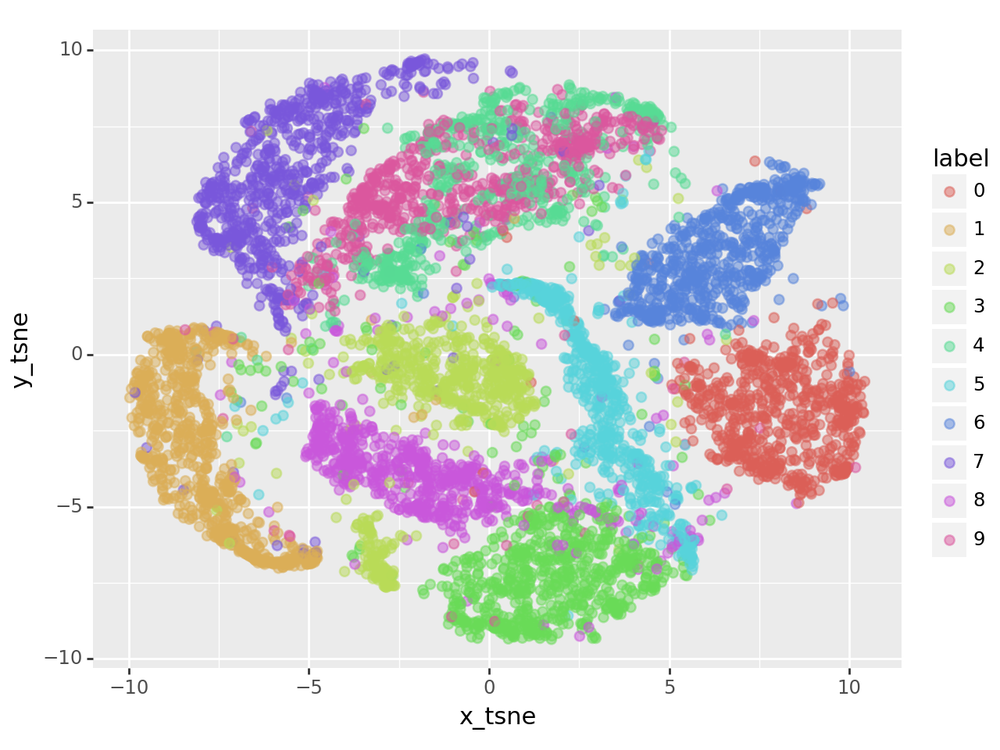

<Figure Size: (640 x 480)>

In [26]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result4[:, 0]
df_tsne['y_tsne'] = tsne_result4[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5)
chart

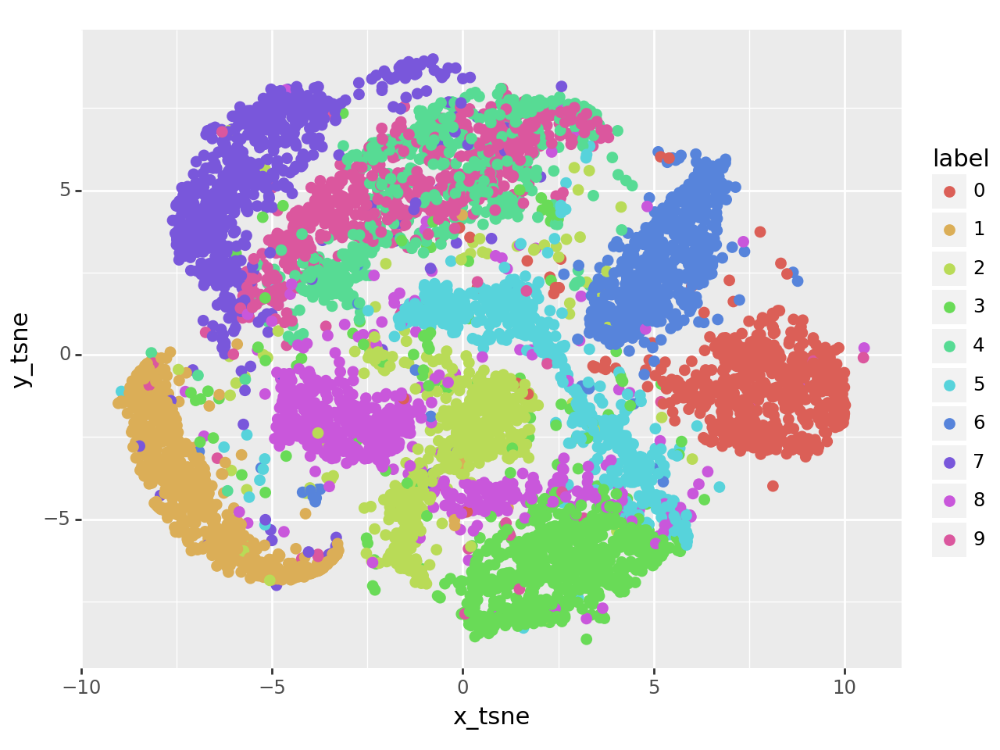

<Figure Size: (640 x 480)>

In [27]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result5[:, 0]
df_tsne['y_tsne'] = tsne_result5[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=1)
chart

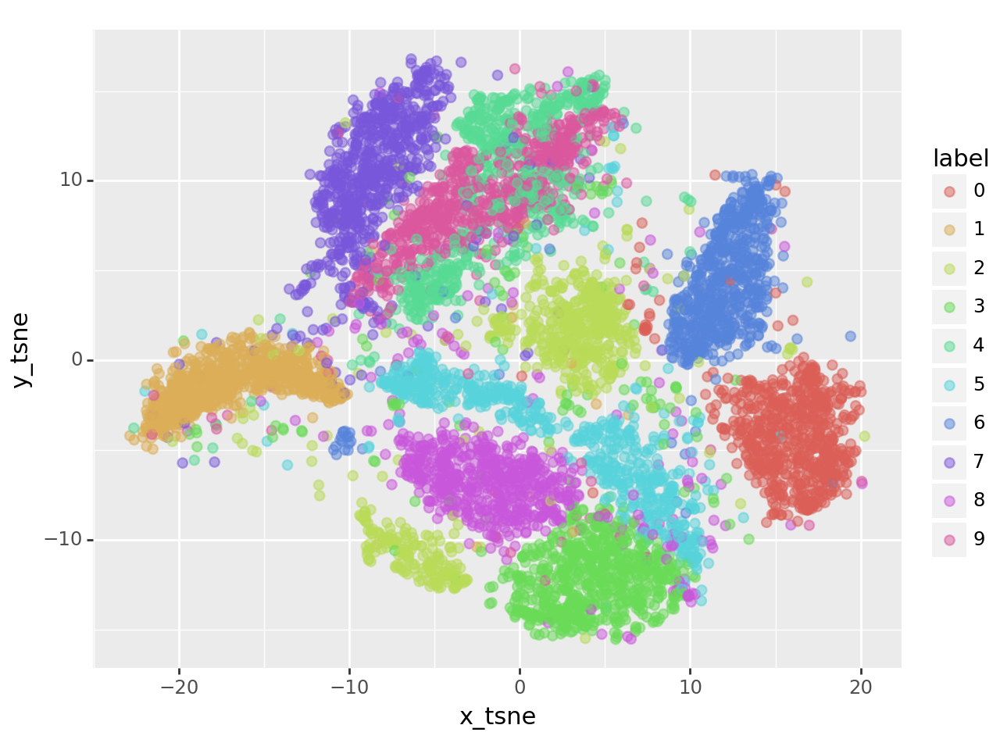

<Figure Size: (640 x 480)>

In [28]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = tsne_result6[:, 0]
df_tsne['y_tsne'] = tsne_result6[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5)
chart

- Perplexity가 너무 작거나 크지만 않으면 군집이 잘 형성
- 단 데이터 수에 비해 perplexity가 너무 크면 군집을 제대로 형성하지 못하고 모든 점들이 균질하게 분포
- mnist 데이터는 데이터 수가 커서 perplexity가 커도 제대로 군집 형성 -> 데이터 수가 많으면 perplexity를 크게 설정하는 것이 좋음

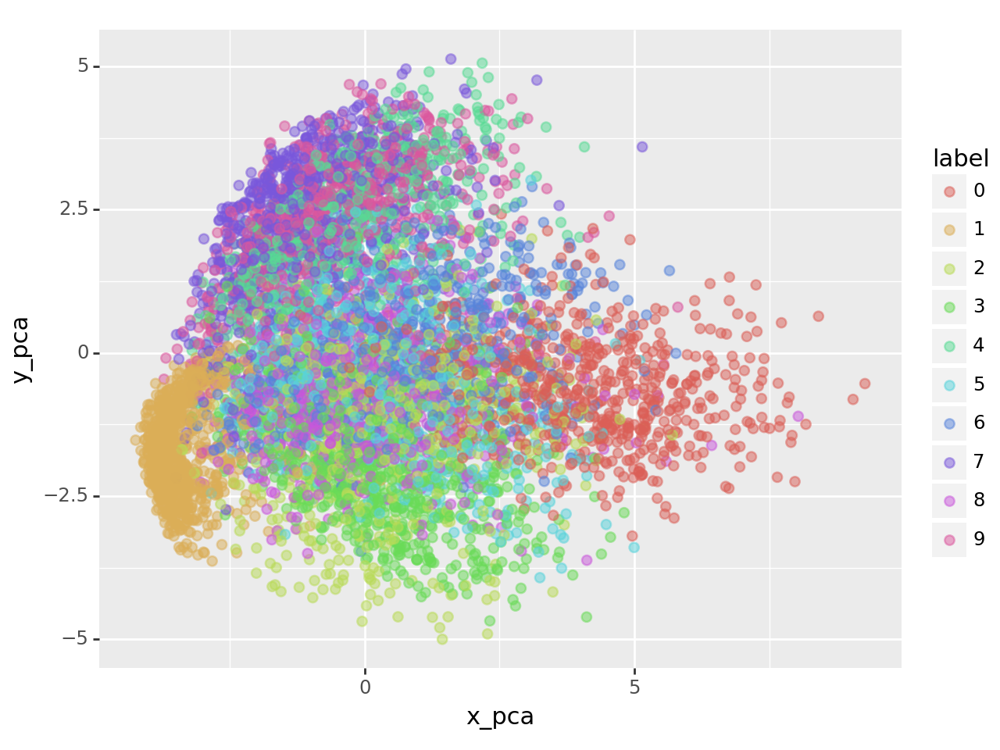

<Figure Size: (640 x 480)>

In [29]:
# pca 결과
df_pca = df.copy()
df_pca['x_pca'] = pca_result1[:, 0]
df_pca['y_pca'] = pca_result1[:, 1]

df_pca_7000 = df_pca.loc[index[:n_sne],:].copy() # t-sne 와 비교하기 위해 마찬가지로 7000개만 추출

chart = ggplot(df_pca_7000, aes(x='x_pca', y='y_pca', color='label')) + geom_point(size=2, alpha=0.5)
chart


#### UMAP

In [30]:
from umap import UMAP

만약 패키지 설치가 안된다면 ?

- Anaconda prompt에서 직접 설치 conda install 패키지 이름
- 그래도 안되면 numba, numpy 지웠다가 다시 설치
- 그래도 안되면 구글링...

In [37]:
umap_start_time = time.time()
umap = UMAP(n_components=2, n_neighbors=15, min_dist=0.25)
umap_result = umap.fit_transform(pca_result)
umap_elapsed_time = time.time() - umap_start_time

In [32]:
umap2 = UMAP(n_components=2, n_neighbors=10, min_dist=0.25)
umap_result2 = umap2.fit_transform(pca_result)

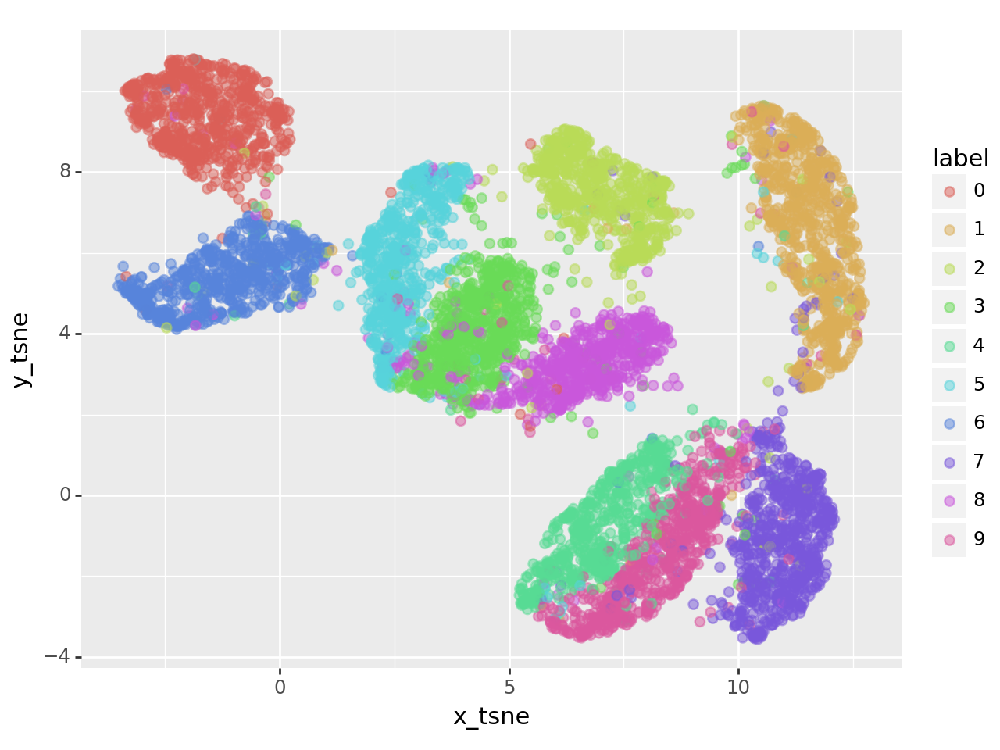

<Figure Size: (640 x 480)>

In [33]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = umap_result[:, 0]
df_tsne['y_tsne'] = umap_result[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5)
chart

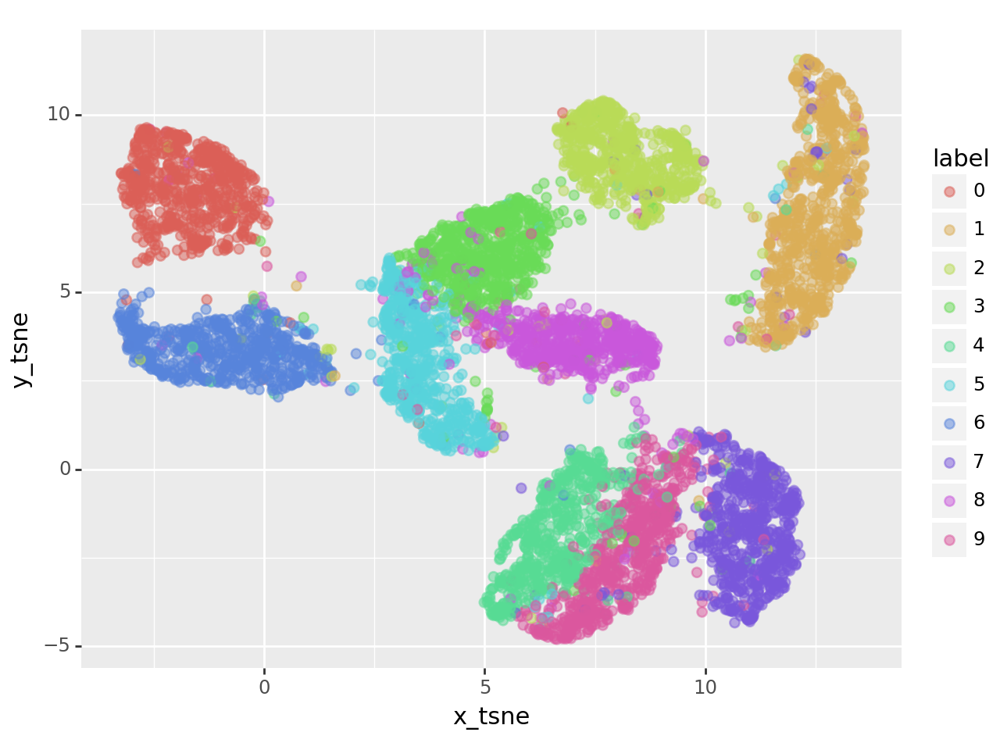

<Figure Size: (640 x 480)>

In [34]:
df_tsne = df.loc[index[:n_sne], :].copy()
df_tsne['x_tsne'] = umap_result2[:, 0]
df_tsne['y_tsne'] = umap_result2[:, 1]

chart = ggplot(df_tsne, aes(x='x_tsne', y='y_tsne', color='label')) + geom_point(size=2, alpha=0.5)
chart

- 시각화가 t-sne보다 잘됨
- n_neighbors를 작게한 두번째 결과는 보다 local한 구조를 잘 살림

In [35]:
print(f"T-SNE 소요 시간: {tsne_elapsed_time} 초")

T-SNE 소요 시간: 10.689379453659058 초


In [38]:
print(f"UMAP 소요 시간: {umap_elapsed_time} 초")

UMAP 소요 시간: 8.783661842346191 초


UMAP이 더 빠르다.